Agnieszka Wrzos

### Opis zbioru danych
Dane:
- artists.csv - informacje o zbiorze danych
- resized.zip - obrazy 50ciu różnych artystów

Źródło: https://www.kaggle.com/datasets/ikarus777/best-artworks-of-all-time/data




In [1]:
import pandas as pd
import numpy as np
from numpy.random import seed
seed(1)

import matplotlib.pyplot as plt
import seaborn as sns

from tqdm import tqdm, tqdm_notebook
import random
import json
import os



In [2]:
# Wczytanie danych
dane = pd.read_csv('data//artists.csv')

In [3]:
# Wstępna analiza danych
dane.shape

(50, 8)

In [4]:
dane

,id,name,years,genre,nationality,bio,wikipedia,paintings
0,0,Amedeo Modigliani,1884 - 1920,Expressionism,Italian,Amedeo Clemente Modigliani (Italian pronunciat...,http://en.wikipedia.org/wiki/Amedeo_Modigliani,193
1,1,Vasiliy Kandinskiy,1866 - 1944,"Expressionism,Abstractionism",Russian,Wassily Wassilyevich Kandinsky (Russian: Васи́...,http://en.wikipedia.org/wiki/Wassily_Kandinsky,88
2,2,Diego Rivera,1886 - 1957,"Social Realism,Muralism",Mexican,Diego María de la Concepción Juan Nepomuceno E...,http://en.wikipedia.org/wiki/Diego_Rivera,70
3,3,Claude Monet,1840 - 1926,Impressionism,French,Oscar-Claude Monet (; French: [klod mɔnɛ]; 14 ...,http://en.wikipedia.org/wiki/Claude_Monet,73
4,4,Rene Magritte,1898 - 1967,"Surrealism,Impressionism",Belgian,René François Ghislain Magritte (French: [ʁəne...,http://en.wikipedia.org/wiki/René_Magritte,194
5,5,Salvador Dali,1904 - 1989,Surrealism,Spanish,Salvador Domingo Felipe Jacinto Dalí i Domènec...,http://en.wikipedia.org/wiki/Salvador_Dalí,139
6,6,Edouard Manet,1832 - 1883,"Realism,Impressionism",French,Édouard Manet (US: ; UK: ; French: [edwaʁ manɛ...,http://en.wikipedia.org/wiki/Édouard_Manet,90
7,7,Andrei Rublev,1360 - 1430,Byzantine Art,Russian,"Andrei Rublev (Russian: Андре́й Рублёв, IPA: [...",http://en.wikipedia.org/wiki/Andrei_Rublev,99
8,8,Vincent van Gogh,1853 – 1890,Post-Impressionism,Dutch,Vincent Willem van Gogh (Dutch: [ˈvɪnsɛnt ˈʋɪl...,http://en.wikipedia.org/wiki/Vincent_van_Gogh,877
9,9,Gustav Klimt,1862 - 1918,"Symbolism,Art Nouveau",Austrian,"Gustav Klimt (July 14, 1862 – February 6, 1918...",http://en.wikipedia.org/wiki/Gustav_Klimt,117


In [5]:
import pandas as pd

# Załaduj dane
# dane = pd.read_csv('ścieżka/do/pliku.csv')

# Definiowanie przedziałów
bins = [0, 49, 99, 149, 199, 250, float('inf')]
labels = ['0 - 49', '50 - 99', '100 - 149', '150 - 199', '200 - 249', '250+']

# Tworzenie kolumny z przedziałami
dane['paintings_range'] = pd.cut(dane['paintings'], bins=bins, labels=labels, right=True)

# Liczenie liczby artystów w każdym przedziale
artist_counts = dane['paintings_range'].value_counts().sort_index()

# Wyświetlenie wyników
print(artist_counts)


0 - 49        5
50 - 99      15
100 - 149    12
150 - 199     7
200 - 249     1
250+         10
Name: paintings_range, dtype: int64


In [ ]:
dane

In [6]:
import pandas as pd

# Wczytanie danych z pliku CSV (zastąp 'dane.csv' rzeczywistą ścieżką do pliku)
# dane = pd.read_csv('ścieżka/do/pliku.csv')

# Grupy stylów i powiązani artyści
style_groups = {
    'Abstract Expressionism': ['Jackson_Pollock'],
    'Baroque': ['Diego_Velazquez', 'Peter_Paul_Rubens', 'Caravaggio', 'Rembrandt'],
    'Byzantine Art': ['Andrei_Rublev'],
    'Cubism': ['Pablo_Picasso'],
    'Early Renaissance': ['Sandro_Botticelli'],
    'Expressionism': ['Amedeo_Modigliani'],
    'High Renaissance': ['Raphael', 'Leonardo_da_Vinci', 'Michelangelo'],
    'Impressionism': ['Claude_Monet', 'Pierre-Auguste_Renoir', 'Alfred_Sisley', 'Edgar_Degas'],
    'Mannerism': ['El_Greco'],
    'Neoplasticism': ['Piet_Mondrian'],
    'Northern Renaissance': ['Hieronymus_Bosch', 'Albrecht_Dürer', 'Pieter_Bruegel', 'Jan_van_Eyck'],
    'Post-Impressionism': ['Vincent_van_Gogh', 'Henri_de_Toulouse-Lautrec', 'Paul_Cezanne', 'Georges_Seurat'],
    'Pop Art': ['Andy_Warhol'],
    'Primitivism': ['Marc_Chagall', 'Henri_Rousseau'],
    'Proto Renaissance': ['Giotto_di_Bondone'],
    'Realism': ['Gustave_Courbet'],
    'Romanticism': ['Francisco_Goya', 'William_Turner', 'Eugene_Delacroix'],
    'Surrealism': ['Salvador_Dali', 'Joan_Miro'],
    'Suprematism': ['Kazimir_Malevich'],
    'Symbolism': ['Mikhail_Vrubel'],

    'Primitivism, Surrealism': ['Frida_Kahlo'],
    'Expressionism, Abstractionism': ['Vasiliy_Kandinskiy'],
    'Symbolism, Art Nouveau': ['Gustav_Klimt'],
    'Impressionism, Post-Impressionism': ['Henri_Matisse', 'Camille_Pissarro'],
    'Muralism, Social Realism': ['Diego_Rivera'],
    'High Renaissance, Mannerism': ['Titian'],
    'Surrealism, Impressionism': ['Rene_Magritte'],
    'Realism, Impressionism': ['Edouard_Manet'],
    'Symbolism, Expressionism': ['Edvard_Munch'],
    'Symbolism, Post-Impressionism': ['Paul_Gauguin'],
    'Expressionism, Abstractionism, Surrealism': ['Paul_Klee']
}

# Funkcja, która zwróci liczbę obrazów dla danego artysty
def get_paintings_count(artist, dane):
    artist_name_in_df = dane[dane['name'] == artist]
    if not artist_name_in_df.empty:
        return artist_name_in_df.iloc[0]['paintings']
    return 0

# Zliczenie obrazów dla każdego stylu
style_paintings_count = {}

for style, artists in style_groups.items():
    total_paintings = 0
    for artist in artists:
        # Zastąp podkreślenia spacjami w nazwach artystów, aby dopasować do danych
        artist = artist.replace('_', ' ')
        total_paintings += get_paintings_count(artist, dane)
    style_paintings_count[style] = total_paintings

# Konwersja słownika na DataFrame
style_paintings_df = pd.DataFrame.from_dict(style_paintings_count, orient='index', columns=['Total_Paintings'])

# Sortowanie według liczby obrazów malejąco
style_paintings_df_sorted = style_paintings_df.sort_values(by='Total_Paintings', ascending=False)

# Wyświetlenie wyników
print(style_paintings_df_sorted)


                                           Total_Paintings
Impressionism                                         1370
Post-Impressionism                                    1048
Northern Renaissance                                   680
Baroque                                                586
Cubism                                                 439
Romanticism                                            388
Symbolism, Post-Impressionism                          311
Primitivism                                            309
High Renaissance                                       301
Impressionism, Post-Impressionism                      277
High Renaissance, Mannerism                            255
Surrealism                                             241
Surrealism, Impressionism                              194
Expressionism                                          193
Expressionism, Abstractionism, Surrealism              188
Pop Art                                                1

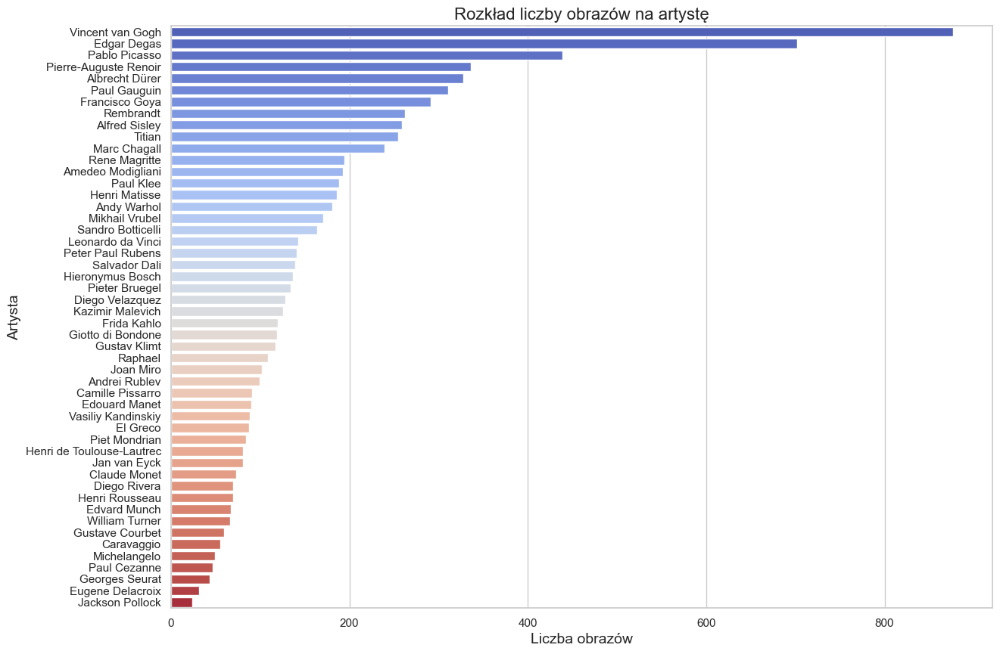

In [7]:
# Wybierz tylko kolumny 'name' i 'paintings'
image_counts = dane[['name', 'paintings']]

# Sortowanie danych według liczby obrazów malejąco
image_counts = image_counts.sort_values(by='paintings', ascending=False)

# Ustawienie stylu wizualizacji
sns.set(style="whitegrid")

# Tworzenie wykresu słupkowego
plt.figure(figsize=(14, 10))
ax = sns.barplot(x='paintings', y='name', data=image_counts, palette="coolwarm")

# Dodanie tytułu i etykiet
ax.set_title('Rozkład liczby obrazów na artystę', fontsize=16)
ax.set_xlabel('Liczba obrazów', fontsize=14)
ax.set_ylabel('Artysta', fontsize=14)

# Wyświetlenie wykresu
plt.show()

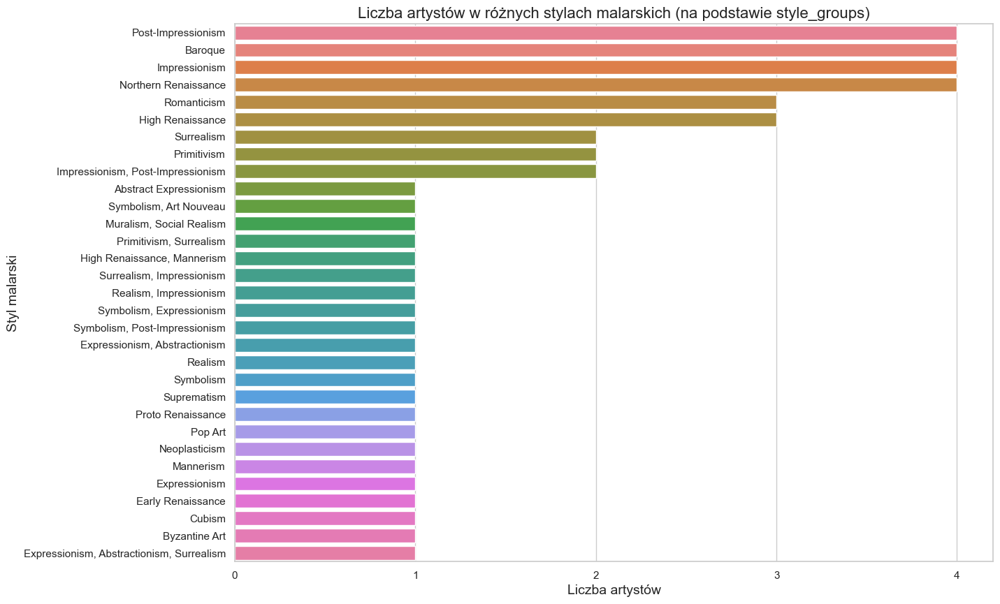

In [8]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Grupy stylów i powiązani artyści
style_groups = {
    'Abstract Expressionism': ['Jackson_Pollock'],
    'Baroque': ['Diego_Velazquez', 'Peter_Paul_Rubens', 'Caravaggio', 'Rembrandt'],
    'Byzantine Art': ['Andrei_Rublev'],
    'Cubism': ['Pablo_Picasso'],
    'Early Renaissance': ['Sandro_Botticelli'],
    'Expressionism': ['Amedeo_Modigliani'],
    'High Renaissance': ['Raphael', 'Leonardo_da_Vinci', 'Michelangelo'],
    'Impressionism': ['Claude_Monet', 'Pierre-Auguste_Renoir', 'Alfred_Sisley', 'Edgar_Degas'],
    'Mannerism': ['El_Greco'],
    'Neoplasticism': ['Piet_Mondrian'],
    'Northern Renaissance': ['Hieronymus_Bosch', 'Albrecht_Dürer', 'Pieter_Bruegel', 'Jan_van_Eyck'],
    'Post-Impressionism': ['Vincent_van_Gogh', 'Henri_de_Toulouse-Lautrec', 'Paul_Cezanne', 'Georges_Seurat'],
    'Pop Art': ['Andy_Warhol'],
    'Primitivism': ['Marc_Chagall', 'Henri_Rousseau'],
    'Proto Renaissance': ['Giotto_di_Bondone'],
    'Realism': ['Gustave_Courbet'],
    'Romanticism': ['Francisco_Goya', 'William_Turner', 'Eugene_Delacroix'],
    'Surrealism': ['Salvador_Dali', 'Joan_Miro'],
    'Suprematism': ['Kazimir_Malevich'],
    'Symbolism': ['Mikhail_Vrubel'],

    'Primitivism, Surrealism': ['Frida_Kahlo'],
    'Expressionism, Abstractionism': ['Vasiliy_Kandinskiy'],
    'Symbolism, Art Nouveau': ['Gustav_Klimt'],
    'Impressionism, Post-Impressionism': ['Henri_Matisse', 'Camille_Pissarro'],
    'Muralism, Social Realism': ['Diego_Rivera'],
    'High Renaissance, Mannerism': ['Titian'],
    'Surrealism, Impressionism': ['Rene_Magritte'],
    'Realism, Impressionism': ['Edouard_Manet'],
    'Symbolism, Expressionism': ['Edvard_Munch'],
    'Symbolism, Post-Impressionism': ['Paul_Gauguin'],
    'Expressionism, Abstractionism, Surrealism': ['Paul_Klee']
}

# Tworzenie słownika dla zliczania liczby artystów dla każdego stylu
style_artist_counts = {style: len(artists) for style, artists in style_groups.items()}

# Konwersja słownika do DataFrame
genre_counts_df = pd.DataFrame(list(style_artist_counts.items()), columns=['genre', 'num_artists'])

# Ustawienie stylu wizualizacji
sns.set(style="whitegrid")

# Tworzenie wykresu słupkowego
plt.figure(figsize=(14, 10))
ax = sns.barplot(x='num_artists', y='genre', data=genre_counts_df.sort_values(by='num_artists', ascending=False), palette="husl")

# Dodanie tytułu i etykiet
ax.set_title('Liczba artystów w różnych stylach malarskich (na podstawie style_groups)', fontsize=16)
ax.set_xlabel('Liczba artystów', fontsize=14)
ax.set_ylabel('Styl malarski', fontsize=14)

# Ustawienie oznaczeń na osi X (tylko liczby całkowite)
plt.xticks(ticks=range(0, genre_counts_df['num_artists'].max() + 1))

# Wyświetlenie wykresu
plt.show()


In [9]:
import pandas as pd
import plotly.express as px

# Zakładamy, że dane są już wczytane do DataFrame o nazwie 'dane'
# dane = pd.read_csv('ścieżka/do/pliku.csv')  # Przykład wczytania danych

# Przetworzenie danych
dane['genre'] = dane['genre'].str.split(',')
dane = dane.explode('genre')

# Usunięcie ewentualnych białych znaków wokół gatunków
dane['genre'] = dane['genre'].str.strip()

# Grupowanie danych
grouped_data = dane.groupby('genre').agg({
    'name': 'count',
    'paintings': 'sum'
}).reset_index()

grouped_data.columns = ['genre', 'artist_count', 'total_paintings']

# Tworzenie wykresu bąbelkowego
fig = px.scatter(grouped_data, 
                 x='genre', 
                 y='artist_count', 
                 size='total_paintings', 
                 color='total_paintings',  # Kolorowanie według liczby obrazów
                 hover_name='genre', 
                 size_max=60,
                 labels={'genre': 'Styl malarski', 'artist_count': 'Liczba artystów', 'total_paintings': 'Liczba obrazów'},
                 title='Liczba artystów, liczba obrazów i styl malarski')

# Aktualizacja wyglądu osi x
fig.update_layout(xaxis={'categoryorder':'total descending', 'title': 'Styl malarski'},
                  yaxis={'title': 'Liczba artystów'},
                  xaxis_tickangle=-45)

# Wyświetlanie wykresu
fig.show()


In [10]:
import pandas as pd
import plotly.express as px

# Zakładamy, że dane są już wczytane do DataFrame o nazwie 'dane'
# dane = pd.read_csv('ścieżka/do/pliku.csv')  # Przykład wczytania danych

# Przetworzenie danych
dane['genre'] = dane['genre'].str.split(',')
dane = dane.explode('genre')

# Grupowanie danych
grouped_data = dane.groupby('genre').agg({
    'name': 'count',
    'paintings': 'sum'
}).reset_index()

grouped_data.columns = ['genre', 'artist_count', 'total_paintings']

# Tworzenie wykresu bąbelkowego
fig = px.scatter(grouped_data, 
                 x='genre', 
                 y='total_paintings', 
                 size='artist_count', 
                 color='artist_count',
                 hover_name='genre', 
                 size_max=50,
                 labels={'total_paintings': 'Liczba obrazów', 'artist_count': 'Liczba artystów', 'genre': 'Styl malarski'},
                 title='Liczba obrazów vs. Styl malarski (wielkość bąbelka: liczba artystów)')

# Aktualizacja wyglądu osi
fig.update_layout(xaxis={'title': 'Styl malarski'},yaxis={'title': 'Liczba obrazów'},xaxis_tickangle=-45)

# Wyświetlanie wykresu
fig.show()


In [11]:
import pandas as pd
import plotly.express as px

# Zakładamy, że dane są już wczytane do DataFrame o nazwie 'dane'
# dane = pd.read_csv('ścieżka/do/pliku.csv')  # Przykład wczytania danych

# Grupy stylów i powiązani artyści
style_groups = {
    'Abstract Expressionism': ['Jackson_Pollock'],
    'Baroque': ['Diego_Velazquez', 'Peter_Paul_Rubens', 'Caravaggio', 'Rembrandt'],
    'Byzantine Art': ['Andrei_Rublev'],
    'Cubism': ['Pablo_Picasso'],
    'Early Renaissance': ['Sandro_Botticelli'],
    'Expressionism': ['Amedeo_Modigliani'],
    'High Renaissance': ['Raphael', 'Leonardo_da_Vinci', 'Michelangelo'],
    'Impressionism': ['Claude_Monet', 'Pierre-Auguste_Renoir', 'Alfred_Sisley', 'Edgar_Degas'],
    'Mannerism': ['El_Greco'],
    'Neoplasticism': ['Piet_Mondrian'],
    'Northern Renaissance': ['Hieronymus_Bosch', 'Albrecht_Dürer', 'Pieter_Bruegel', 'Jan_van_Eyck'],
    'Post-Impressionism': ['Vincent_van_Gogh', 'Henri_de_Toulouse-Lautrec', 'Paul_Cezanne', 'Georges_Seurat'],
    'Pop Art': ['Andy_Warhol'],
    'Primitivism': ['Marc_Chagall', 'Henri_Rousseau'],
    'Proto Renaissance': ['Giotto_di_Bondone'],
    'Realism': ['Gustave_Courbet'],
    'Romanticism': ['Francisco_Goya', 'William_Turner', 'Eugene_Delacroix'],
    'Surrealism': ['Salvador_Dali', 'Joan_Miro'],
    'Suprematism': ['Kazimir_Malevich'],
    'Symbolism': ['Mikhail_Vrubel'],

    'Primitivism, Surrealism': ['Frida_Kahlo'],
    'Expressionism, Abstractionism': ['Vasiliy_Kandinskiy'],
    'Symbolism, Art Nouveau': ['Gustav_Klimt'],
    'Impressionism, Post-Impressionism': ['Henri_Matisse', 'Camille_Pissarro'],
    'Muralism, Social Realism': ['Diego_Rivera'],
    'High Renaissance, Mannerism': ['Titian'],
    'Surrealism, Impressionism': ['Rene_Magritte'],
    'Realism, Impressionism': ['Edouard_Manet'],
    'Symbolism, Expressionism': ['Edvard_Munch'],
    'Symbolism, Post-Impressionism': ['Paul_Gauguin'],
    'Expressionism, Abstractionism, Surrealism': ['Paul_Klee']
}

artist_names = ['Jackson_Pollock', 'Diego_Velazquez', 'Peter_Paul_Rubens', 'Caravaggio', 'Rembrandt', 'Andrei_Rublev', 'Pablo_Picasso', 'Sandro_Botticelli', 'Amedeo_Modigliani', 'Raphael', 'Leonardo_da_Vinci', 'Michelangelo', 'Claude_Monet', 'Pierre-Auguste_Renoir', 'Alfred_Sisley', 'Edgar_Degas', 'El_Greco', 'Piet_Mondrian', 'Hieronymus_Bosch', 'Albrecht_Dürer', 'Pieter_Bruegel', 'Jan_van_Eyck', 'Vincent_van_Gogh', 'Henri_de_Toulouse-Lautrec', 'Paul_Cezanne', 'Georges_Seurat', 'Andy_Warhol', 'Marc_Chagall', 'Henri_Rousseau', 'Giotto_di_Bondone', 'Gustave_Courbet', 'Francisco_Goya', 'William_Turner', 'Eugene_Delacroix', 'Salvador_Dali', 'Joan_Miro', 'Kazimir_Malevich', 'Mikhail_Vrubel', 'Frida_Kahlo', 'Vasiliy_Kandinskiy', 'Gustav_Klimt', 'Henri_Matisse', 'Camille_Pissarro', 'Diego_Rivera', 'Titian', 'Rene_Magritte', 'Edouard_Manet', 'Edvard_Munch', 'Paul_Gauguin', 'Paul_Klee']

# Usuwanie nadmiarowych białych znaków w 'name'
dane['name'] = dane['name'].str.strip()

# Tworzenie słownika dla przypisania artystów do stylów
style_artist_paintings = {style: {'artists': set(), 'paintings': 0} for style in style_groups}

# Przypisywanie artystów do stylów oraz sumowanie liczby obrazów
for style, artists in style_groups.items():
    for artist in artists:
        # Znajdujemy rekordy w 'dane' dla danego artysty
        artist_data = dane[dane['name'].str.contains(artist.replace('_', ' '), case=False, na=False)]
        
        if not artist_data.empty:
            # Dodajemy artystę do stylu
            style_artist_paintings[style]['artists'].add(artist)
            
            # Sumujemy liczbę obrazów tego artysty
            style_artist_paintings[style]['paintings'] += artist_data['paintings'].sum()

# Obliczenie liczby artystów z listy 'artist_names'
artist_counts = {artist: sum(dane['name'].str.contains(artist.replace('_', ' '), case=False, na=False)) for artist in artist_names}

# Konwersja słownika na DataFrame
style_summary = pd.DataFrame({
    'genre': list(style_artist_paintings.keys()),
    'artist_count': [len(info['artists']) for info in style_artist_paintings.values()],
    'total_paintings': [info['paintings'] for info in style_artist_paintings.values()]
})

# Tworzenie wykresu bąbelkowego
fig = px.scatter(style_summary, 
                 x='genre', 
                 y='total_paintings',  # Liczba obrazów na osi Y
                 size='artist_count',  # Rozmiar bąbelków na podstawie liczby artystów
                 color='artist_count',  # Kolorowanie według liczby artystów
                 hover_name='genre', 
                 size_max=60,
                 labels={'genre': 'Styl malarski', 'total_paintings': 'Liczba obrazów', 'artist_count': 'Liczba artystów'},
                 title='Liczba obrazów i styl malarski (wielkość bąbelka: liczba artystów)')

# Aktualizacja wyglądu osi i wysokości
fig.update_layout(
    xaxis={'title': 'Styl malarski', 'categoryorder': 'category ascending'},  # Sortowanie alfabetyczne
    yaxis={'title': 'Liczba obrazów', 'tickmode': 'linear', 'tick0': 0, 'dtick': 100},
    xaxis_tickangle=-45,
    height=1000  # Zwiększenie wysokości wykresu
)

# Wyświetlanie wykresu
fig.show()


In [12]:
import pandas as pd
import plotly.express as px

# Zakładamy, że dane są już wczytane do DataFrame o nazwie 'dane'
# dane = pd.read_csv('ścieżka/do/pliku.csv')  # Przykład wczytania danych

# Grupy stylów i powiązani artyści
style_groups = {
    'Abstract Expressionism': ['Jackson_Pollock'],
    'Baroque': ['Diego_Velazquez', 'Peter_Paul_Rubens', 'Caravaggio', 'Rembrandt'],
    'Byzantine Art': ['Andrei_Rublev'],
    'Cubism': ['Pablo_Picasso'],
    'Early Renaissance': ['Sandro_Botticelli'],
    'Expressionism': ['Amedeo_Modigliani'],
    'High Renaissance': ['Raphael', 'Leonardo_da_Vinci', 'Michelangelo'],
    'Impressionism': ['Claude_Monet', 'Pierre-Auguste_Renoir', 'Alfred_Sisley', 'Edgar_Degas'],
    'Mannerism': ['El_Greco'],
    'Neoplasticism': ['Piet_Mondrian'],
    'Northern Renaissance': ['Hieronymus_Bosch', 'Albrecht_Dürer', 'Pieter_Bruegel', 'Jan_van_Eyck'],
    'Post-Impressionism': ['Vincent_van_Gogh', 'Henri_de_Toulouse-Lautrec', 'Paul_Cezanne', 'Georges_Seurat'],
    'Pop Art': ['Andy_Warhol'],
    'Primitivism': ['Marc_Chagall', 'Henri_Rousseau'],
    'Proto Renaissance': ['Giotto_di_Bondone'],
    'Realism': ['Gustave_Courbet'],
    'Romanticism': ['Francisco_Goya', 'William_Turner', 'Eugene_Delacroix'],
    'Surrealism': ['Salvador_Dali', 'Joan_Miro'],
    'Suprematism': ['Kazimir_Malevich'],
    'Symbolism': ['Mikhail_Vrubel'],

    'Primitivism, Surrealism': ['Frida_Kahlo'],
    'Expressionism, Abstractionism': ['Vasiliy_Kandinskiy'],
    'Symbolism, Art Nouveau': ['Gustav_Klimt'],
    'Impressionism, Post-Impressionism': ['Henri_Matisse', 'Camille_Pissarro'],
    'Muralism, Social Realism': ['Diego_Rivera'],
    'High Renaissance, Mannerism': ['Titian'],
    'Surrealism, Impressionism': ['Rene_Magritte'],
    'Realism, Impressionism': ['Edouard_Manet'],
    'Symbolism, Expressionism': ['Edvard_Munch'],
    'Symbolism, Post-Impressionism': ['Paul_Gauguin'],
    'Expressionism, Abstractionism, Surrealism': ['Paul_Klee']
}

artist_names = ['Jackson_Pollock', 'Diego_Velazquez', 'Peter_Paul_Rubens', 'Caravaggio', 'Rembrandt', 'Andrei_Rublev', 'Pablo_Picasso', 'Sandro_Botticelli', 'Amedeo_Modigliani', 'Raphael', 'Leonardo_da_Vinci', 'Michelangelo', 'Claude_Monet', 'Pierre-Auguste_Renoir', 'Alfred_Sisley', 'Edgar_Degas', 'El_Greco', 'Piet_Mondrian', 'Hieronymus_Bosch', 'Albrecht_Dürer', 'Pieter_Bruegel', 'Jan_van_Eyck', 'Vincent_van_Gogh', 'Henri_de_Toulouse-Lautrec', 'Paul_Cezanne', 'Georges_Seurat', 'Andy_Warhol', 'Marc_Chagall', 'Henri_Rousseau', 'Giotto_di_Bondone', 'Gustave_Courbet', 'Francisco_Goya', 'William_Turner', 'Eugene_Delacroix', 'Salvador_Dali', 'Joan_Miro', 'Kazimir_Malevich', 'Mikhail_Vrubel', 'Frida_Kahlo', 'Vasiliy_Kandinskiy', 'Gustav_Klimt', 'Henri_Matisse', 'Camille_Pissarro', 'Diego_Rivera', 'Titian', 'Rene_Magritte', 'Edouard_Manet', 'Edvard_Munch', 'Paul_Gauguin', 'Paul_Klee']

# Usuwanie nadmiarowych białych znaków w 'name'
dane['name'] = dane['name'].str.strip()

# Tworzenie słownika dla przypisania artystów do stylów
style_artist_paintings = {style: {'artists': set(), 'paintings': 0} for style in style_groups}

# Przypisywanie artystów do stylów oraz sumowanie liczby obrazów
for style, artists in style_groups.items():
    for artist in artists:
        # Znajdujemy rekordy w 'dane' dla danego artysty
        artist_data = dane[dane['name'].str.contains(artist.replace('_', ' '), case=False, na=False)]
        
        if not artist_data.empty:
            # Dodajemy artystę do stylu
            style_artist_paintings[style]['artists'].add(artist)
            
            # Sumujemy liczbę obrazów tego artysty
            style_artist_paintings[style]['paintings'] += artist_data['paintings'].sum()

# Obliczenie liczby artystów z listy 'artist_names'
artist_counts = {artist: sum(dane['name'].str.contains(artist.replace('_', ' '), case=False, na=False)) for artist in artist_names}

# Konwersja słownika na DataFrame
style_summary = pd.DataFrame({
    'genre': list(style_artist_paintings.keys()),
    'artist_count': [len(info['artists']) for info in style_artist_paintings.values()],
    'total_paintings': [info['paintings'] for info in style_artist_paintings.values()]
})

# Tworzenie wykresu bąbelkowego
fig = px.scatter(style_summary, 
                 x='total_paintings',  # Liczba obrazów na osi X
                 y='genre',  # Styl malarski na osi Y
                 size='artist_count',  # Rozmiar bąbelków na podstawie liczby artystów
                 color='artist_count',  # Kolorowanie według liczby artystów
                 hover_name='genre', 
                 size_max=60,
                 labels={'total_paintings': 'Liczba obrazów', 'artist_count': 'Liczba artystów', 'genre': 'Styl malarski'},
                 title='Liczba obrazów i styl malarski (wielkość bąbelka: liczba artystów)')

# Aktualizacja wyglądu osi
fig.update_layout(xaxis={'title': 'Liczba obrazów', 'tickmode': 'linear', 'tick0': 0, 'dtick': 100},
                  yaxis={'title': 'Styl malarski', 'categoryorder': 'total descending'},
                  xaxis_tickangle=-45,
                 height=800  )

# Wyświetlanie wykresu
fig.show()


In [13]:
import pandas as pd
import plotly.express as px

# Zakładamy, że dane są już wczytane do DataFrame o nazwie 'dane'
# dane = pd.read_csv('ścieżka/do/pliku.csv')  # Przykład wczytania danych

# Grupy stylów i powiązani artyści
style_groups = {
    'Abstract Expressionism': ['Jackson_Pollock'],
    'Baroque': ['Diego_Velazquez', 'Peter_Paul_Rubens', 'Caravaggio', 'Rembrandt'],
    'Byzantine Art': ['Andrei_Rublev'],
    'Cubism': ['Pablo_Picasso'],
    'Early Renaissance': ['Sandro_Botticelli'],
    'Expressionism': ['Amedeo_Modigliani'],
    'High Renaissance': ['Raphael', 'Leonardo_da_Vinci', 'Michelangelo'],
    'Impressionism': ['Claude_Monet', 'Pierre-Auguste_Renoir', 'Alfred_Sisley', 'Edgar_Degas'],
    'Mannerism': ['El_Greco'],
    'Neoplasticism': ['Piet_Mondrian'],
    'Northern Renaissance': ['Hieronymus_Bosch', 'Albrecht_Dürer', 'Pieter_Bruegel', 'Jan_van_Eyck'],
    'Post-Impressionism': ['Vincent_van_Gogh', 'Henri_de_Toulouse-Lautrec', 'Paul_Cezanne', 'Georges_Seurat'],
    'Pop Art': ['Andy_Warhol'],
    'Primitivism': ['Marc_Chagall', 'Henri_Rousseau'],
    'Proto Renaissance': ['Giotto_di_Bondone'],
    'Realism': ['Gustave_Courbet'],
    'Romanticism': ['Francisco_Goya', 'William_Turner', 'Eugene_Delacroix'],
    'Surrealism': ['Salvador_Dali', 'Joan_Miro'],
    'Suprematism': ['Kazimir_Malevich'],
    'Symbolism': ['Mikhail_Vrubel'],

    'Primitivism, Surrealism': ['Frida_Kahlo'],
    'Expressionism, Abstractionism': ['Vasiliy_Kandinskiy'],
    'Symbolism, Art Nouveau': ['Gustav_Klimt'],
    'Impressionism, Post-Impressionism': ['Henri_Matisse', 'Camille_Pissarro'],
    'Muralism, Social Realism': ['Diego_Rivera'],
    'High Renaissance, Mannerism': ['Titian'],
    'Surrealism, Impressionism': ['Rene_Magritte'],
    'Realism, Impressionism': ['Edouard_Manet'],
    'Symbolism, Expressionism': ['Edvard_Munch'],
    'Symbolism, Post-Impressionism': ['Paul_Gauguin'],
    'Expressionism, Abstractionism, Surrealism': ['Paul_Klee']
}

# Usuwanie nadmiarowych białych znaków w 'name'
dane['name'] = dane['name'].str.strip()

# Tworzenie słownika dla przypisania artystów do stylów
style_artist_paintings = {style: {'artists': set(), 'paintings': 0} for style in style_groups}

# Przypisywanie artystów do stylów oraz sumowanie liczby obrazów
for style, artists in style_groups.items():
    for artist in artists:
        # Znajdujemy rekordy w 'dane' dla danego artysty
        artist_data = dane[dane['name'].str.contains(artist.replace('_', ' '), case=False, na=False)]
        
        if not artist_data.empty:
            # Dodajemy artystę do stylu
            style_artist_paintings[style]['artists'].add(artist)
            
            # Sumujemy liczbę obrazów tego artysty
            style_artist_paintings[style]['paintings'] += artist_data['paintings'].sum()

# Konwersja słownika na DataFrame
style_summary = pd.DataFrame({
    'genre': list(style_artist_paintings.keys()),
    'artist_count': [len(info['artists']) for info in style_artist_paintings.values()],
    'total_paintings': [info['paintings'] for info in style_artist_paintings.values()]
})

# Tworzenie wykresu bąbelkowego
fig = px.scatter(style_summary, 
                 x='genre', 
                 y='artist_count', 
                 size='total_paintings', 
                 color='total_paintings',  # Kolorowanie według liczby obrazów
                 hover_name='genre', 
                 size_max=60,
                 labels={'genre': 'Styl malarski', 'artist_count': 'Liczba artystów', 'total_paintings': 'Liczba obrazów'},
                 title='Liczba artystów, liczba obrazów i styl malarski')

# Aktualizacja wyglądu osi x
fig.update_layout(xaxis={'categoryorder':'total descending', 'title': 'Styl malarski'},
                  yaxis={
                    'title': 'Liczba artystów',
                    'tickmode': 'linear',
                    'tick0': 1,            
                    'dtick': 1},
                  xaxis_tickangle=-45)


# Wyświetlanie wykresu
fig.show()


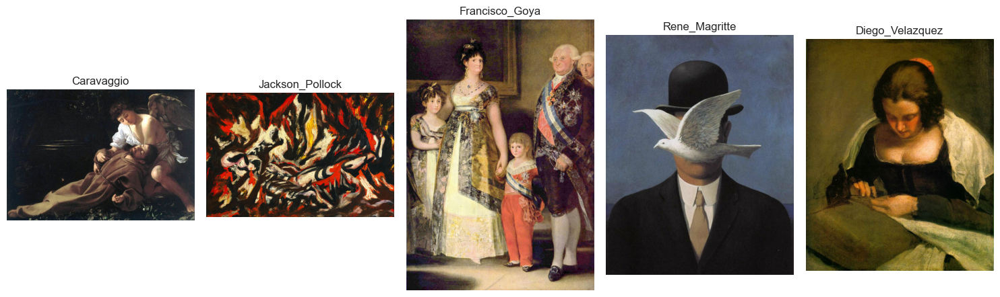

In [14]:
import os
import random
from PIL import Image
import matplotlib.pyplot as plt

# Ścieżka do folderu z obrazami
images_dir = 'data/images/images'

# Pobieranie wszystkich folderów w images_dir
folders = [folder for folder in os.listdir(images_dir) if os.path.isdir(os.path.join(images_dir, folder))]

# Wybieranie losowych 5 folderów
random_folders = random.sample(folders, 5)

# Przygotowywanie obrazów do wyświetlenia
images_to_display = []
for folder in random_folders:
    folder_path = os.path.join(images_dir, folder)
    images = [os.path.join(folder_path, img) for img in os.listdir(folder_path) if img.endswith(('png', 'jpg', 'jpeg'))]
    if images:
        random_image = random.choice(images)
        images_to_display.append((folder, random_image))

# Wyświetlanie obrazów
plt.figure(figsize=(15, 10))

for i, (folder, image_path) in enumerate(images_to_display):
    img = Image.open(image_path)
    plt.subplot(1, 5, i+1)
    plt.imshow(img)
    plt.title(folder)
    plt.axis('off')

plt.tight_layout()
plt.show()


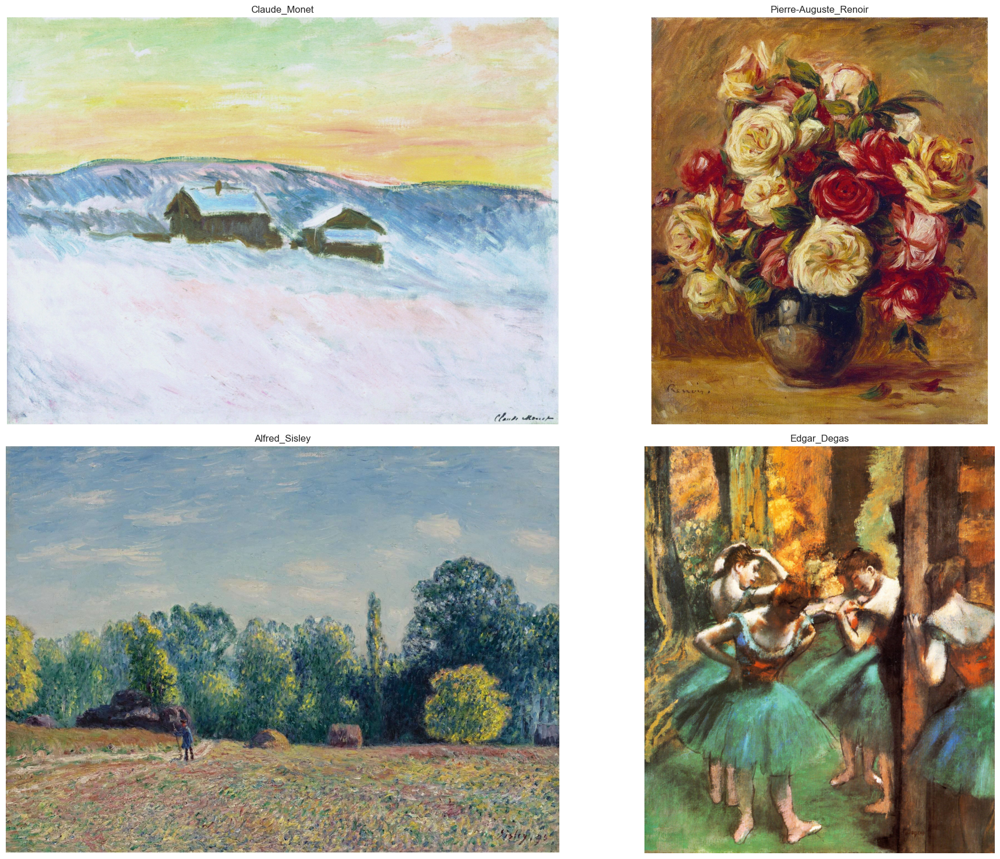

In [49]:
import os
import random
from PIL import Image
import matplotlib.pyplot as plt

# Lista artystów związanych z impresjonizmem
impressionist_artists = ['Claude_Monet', 
                         'Pierre-Auguste_Renoir', 
                         'Alfred_Sisley', 
                         'Edgar_Degas'
]

# Ścieżka do folderu z obrazami
images_dir = 'data/images/images'

# Przygotowywanie obrazów do wyświetlenia
images_to_display = []

for artist in impressionist_artists:
    folder_path = os.path.join(images_dir, artist)
    if os.path.exists(folder_path):
        images = [os.path.join(folder_path, img) for img in os.listdir(folder_path) if img.endswith(('png', 'jpg', 'jpeg'))]
        if images:
            random_image = random.choice(images)
            images_to_display.append((artist, random_image))

# Wyświetlanie obrazów
plt.figure(figsize=(20, 15))

for i, (artist, image_path) in enumerate(images_to_display):
    img = Image.open(image_path)
    plt.subplot(2, 2, i+1)
    plt.imshow(img)
    plt.title(artist)
    plt.axis('off')

plt.tight_layout()
plt.show()


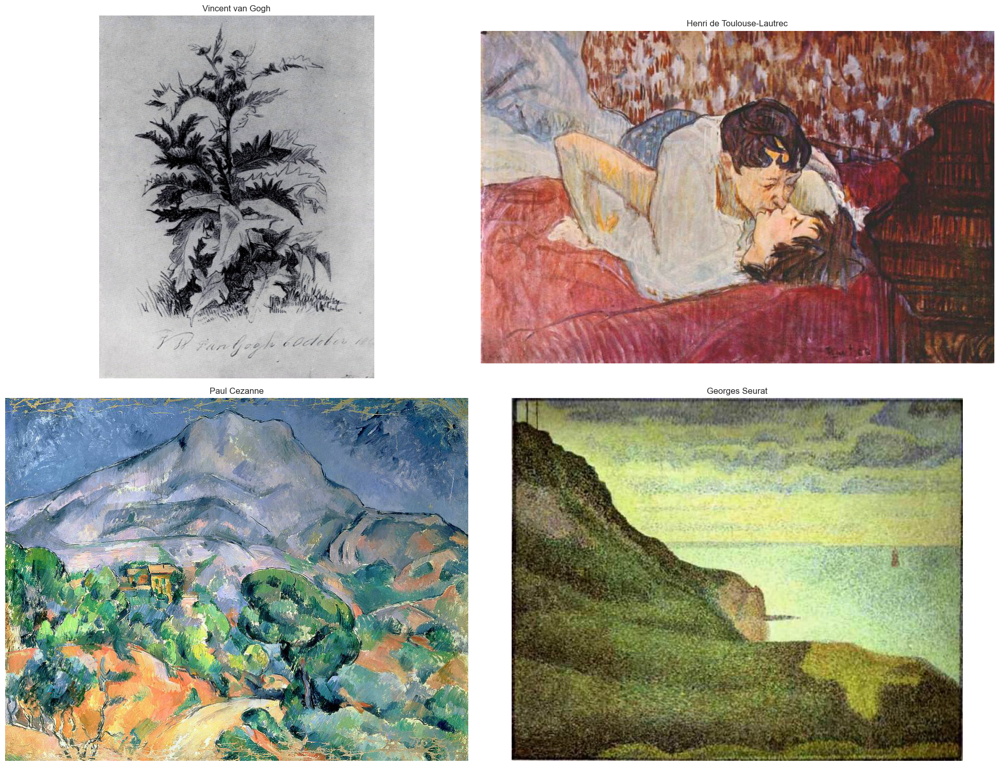

In [50]:
import os
import random
from PIL import Image
import matplotlib.pyplot as plt

# Lista artystów związanych z post-impresjonizmem
post_impressionist_artists = [
    'Vincent_van_Gogh', 
    'Henri_de_Toulouse-Lautrec', 
    'Paul_Cezanne', 
    'Georges_Seurat'
]

# Ścieżka do folderu z obrazami
images_dir = 'data/images/images'

# Przygotowywanie obrazów do wyświetlenia
images_to_display = []

for artist in post_impressionist_artists:
    folder_path = os.path.join(images_dir, artist)
    if os.path.exists(folder_path):
        images = [os.path.join(folder_path, img) for img in os.listdir(folder_path) if img.endswith(('png', 'jpg', 'jpeg'))]
        if images:
            random_image = random.choice(images)
            images_to_display.append((artist.replace("_", " "), random_image))
        else:
            print(f"No images found in folder for artist: {artist}")
    else:
        print(f"Folder not found for artist: {artist}")

# Sprawdźmy, czy lista obrazów nie jest pusta
if not images_to_display:
    print("No images to display.")
else:
    # Wyświetlanie obrazów
    plt.figure(figsize=(20, 15))

    for i, (artist, image_path) in enumerate(images_to_display):
        img = Image.open(image_path)
        plt.subplot(2, 2, i+1)
        plt.imshow(img)
        plt.title(artist)
        plt.axis('off')

    plt.tight_layout()
    plt.show()


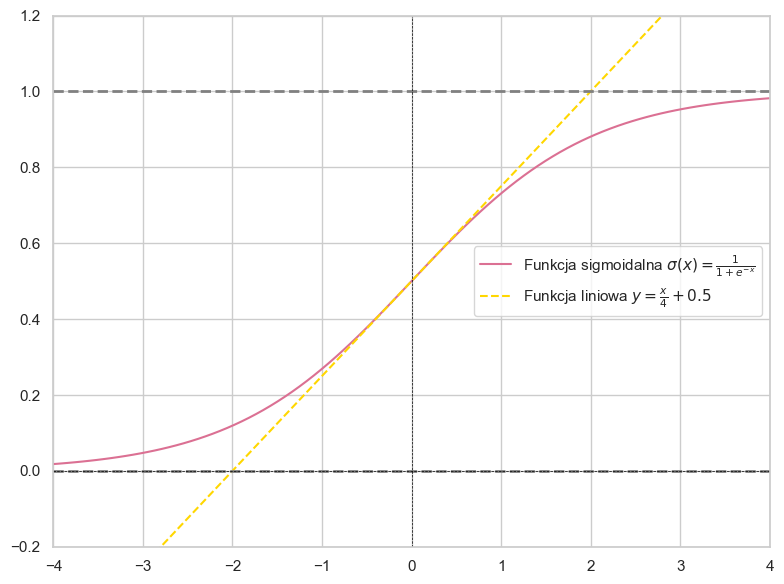

In [26]:
import numpy as np
import matplotlib.pyplot as plt

# Definicja funkcji sigmoidalnej
def sigmoid(x):
    return 1 / (1 + np.exp(-x))

# Zakres wartości x
x = np.linspace(-4, 4, 100)
# Wartości funkcji sigmoidalnej dla zakresu x
y_sigmoid = sigmoid(x)
# Wartości funkcji liniowej dla porównania
y_linear = x / 4 + 0.5  # Linia liniowa y = x/4 + 0.5

# Tworzenie wykresu
plt.figure(figsize=(8, 6))

# Wykres funkcji sigmoidalnej
plt.plot(x, y_sigmoid, label='Funkcja sigmoidalna $\sigma(x) = \\frac{1}{1+e^{-x}}$', color='palevioletred')
# Linia funkcji liniowej
plt.plot(x, y_linear, label='Funkcja liniowa $y = \\frac{x}{4} + 0.5$', color='gold', linestyle='--')



plt.xlim(-4, 4)
plt.ylim(-0.2, 1.2)
plt.grid(True)  # Włączenie siatki

# Grube przerywane linie poziome w ciemnym szarym kolorze
plt.axhline(1, color='gray', linewidth=2, linestyle='--')
plt.axhline(0, color='gray', linewidth=2, linestyle='--')

plt.axhline(0, color='black', linewidth=0.5, linestyle='--')
plt.axvline(0, color='black', linewidth=0.5, linestyle='--')
plt.legend()

plt.tight_layout()
plt.show()
